In [2]:
from desc.grid import Grid, LinearGrid
from desc.backend import jnp
import matplotlib.pyplot as plt
import desc.equilibrium
from desc.equilibrium import Equilibrium
from desc.plotting import plot_3d
import numpy as np
import plotly.graph_objects as go

DESC version 0+untagged.6882.g7ed03d7.dirty,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 2.25 GB available memory


In [8]:
# Function to upload the data - the files have four columns, which go to for jnp.arrays
def upload_data(filename):
    data = np.loadtxt(filename)
    return data
data = upload_data("result_diffrax2/tracing_optimized.txt")

def Trajectory_Plot(solution):
    fig, ax = plt.subplots()
    ax.plot(jnp.sqrt(solution[:, 0]) * jnp.cos(solution[:, 1]), jnp.sqrt(solution[:, 0]) * jnp.sin(solution[:, 1]))
    ax.set_aspect("equal", adjustable='box')
    plt.xlabel(r'$\sqrt{\psi}cos(\theta)$')
    plt.ylabel(r'$\sqrt{\psi}sin(\theta)$')
    plt.show()

def Quantity_Plot(tmax, solution):
    time = jnp.liunspace(0, tmax, len(solution[:, 0]))
    fig, axs = plt.subplots(2, 2)
    axs[0, 1].plot(time, solution[:, 0], 'tab:orange')
    axs[0, 1].set_title(r'$\psi$ (t)')
    axs[1, 0].plot(time, solution[:, 1], 'tab:green')
    axs[1, 0].set_title(r'$\theta$ (t)')
    axs[1, 1].plot(time, solution[:, 2], 'tab:red')
    axs[1, 1].set_title(r'$\zeta$ (t)')
    axs[0, 0].plot(time, solution[:, 3], 'tab:blue')
    axs[0, 0].set_title(r"$v_{\parallel}$ (t)")
    fig = plt.gcf()
    fig.set_size_inches(10.5, 10.5)
    plt.show()

In [9]:
eq = desc.io.load("result_diffrax2/optimized_eq_2411_M1_N1.h5")
eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
eq._current = None

In [10]:
grid = Grid(np.vstack((np.sqrt(data[:, 0]), data[:, 1], data[:, 2])).T,sort=False)

data_desc = eq.compute(["X", "Y", "Z"], grid)

<Figure size 576x384 with 0 Axes>

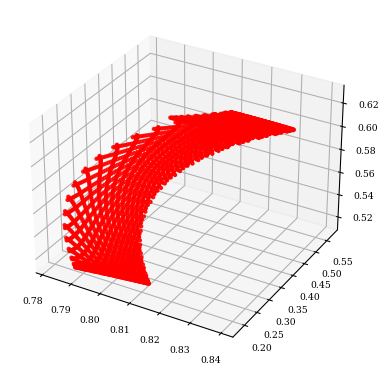

In [11]:
def plot_trajectory(data, ax=None, **kwargs):
    if ax is None:
        fig = plt.figure()
        ax = plt.figure().add_subplot(projection='3d')
    ax.scatter(data_desc["X"], data_desc["Y"], data_desc["Z"], **kwargs)
    return ax

ax = plot_trajectory(data, color="r", marker=".")

In [12]:
grid = LinearGrid(rho=np.sqrt(0.8), M = 100, N = 100)
fig = plot_3d(eq, "B", alpha=0.3, grid=grid)
fig.add_trace(go.Scatter3d(x=data_desc["X"], y=data_desc["Y"], z=data_desc["Z"], mode='markers', marker_size=2))
# fig.write_image("surface_and_tracing.png")